# EYE FOR BLIND

**by Krishna Kumar.S**

We will create a deep learning model which can explain the contents of an image in the form of speech through caption generation with an attention mechanism on Flickr8K dataset. This kind of model is a use-case for blind people so that they can understand any image with the help of speech. The caption generated through a CNN-RNN model will be converted to speech using a text to speech library.


This problem statement is an application of both deep learning and natural language processing. The features of an image will be extracted by a CNN-based encoder and this will be decoded by an RNN model.


The project is an extended application of Show, Attend and Tell: Neural Image Caption Generation with Visual Attention paper.


The dataset is taken from the Kaggle website and it consists of sentence-based image descriptions having a list of 8,000 images that are each paired with five different captions which provide clear descriptions of the salient entities and events of the image.

In [ ]:
!pip install gTTS \
             matplotlib \
             pandas \
             tensorflow \
             scikit-learn \
             Pillow \
             nltk \
             kaggle

In [ ]:
#Import all the required libraries
import glob
import os
import re
import tqdm
import time

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd


import tensorflow as tf
from tensorflow.keras import Model, Layer
from sklearn.model_selection import train_test_split

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

from IPython.display import display, Audio, HTML
from gtts import gTTS

from nltk.translate.bleu_score import sentence_bleu

In [ ]:
tf.__version__

'2.19.0'

In [ ]:
# List physical GPU devices
gpus = tf.config.list_physical_devices('GPU')

print("Number of GPUs available:", len(gpus))
for gpu in gpus:
    print("Name:", gpu.name, "| Type:", gpu.device_type)

# To get more detailed info like device name and compute capability
for gpu in gpus:
    details = tf.config.experimental.get_device_details(gpu)
    print("Details:", details)

Number of GPUs available: 1
Name: /physical_device:GPU:0 | Type: GPU
Details: {'compute_capability': (7, 5), 'device_name': 'Tesla T4'}


## Data understanding
1.Import the dataset and read image & captions into two seperate variables

2.Visualise both the images & text present in the dataset

3.Create a dataframe which summarizes the image, path & captions as a dataframe

4.Create a list which contains all the captions & path

5.Visualise the top 30 occuring words in the captions



Kaggle Dataset is present at - https://www.kaggle.com/datasets/adityajn105/flickr8k

**Get the Kaggle API Token**

- Go to Kaggle account settings (https://www.kaggle.com/ → Profile → Account).

- Scroll to “API” section and click “Create New API Token”. This downloads a file named kaggle.json to your computer.

In [ ]:
# 1. Upload kaggle.json
from google.colab import files
files.upload() # upload kaggle.json

# 2. Install and configure kaggle
#!pip install kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# 3. Download dataset
!kaggle datasets download adityajn105/flickr8k

# 4. Unzip
!unzip flickr8k.zip

**Set Paths**

In [ ]:
CONTENT_DIR = "/content"
IMAGES_DIR = os.path.join(CONTENT_DIR,'Images')
MP3_DIR = os.path.join(CONTENT_DIR,'MP3')
# create MP3_DIR
os.makedirs(MP3_DIR, exist_ok=True)
CAPTIONS_FILE = os.path.join(CONTENT_DIR,'captions.txt')

In [ ]:
# Import the dataset and read the image into a seperate variable

all_imgs = glob.glob(IMAGES_DIR + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 8091


image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .


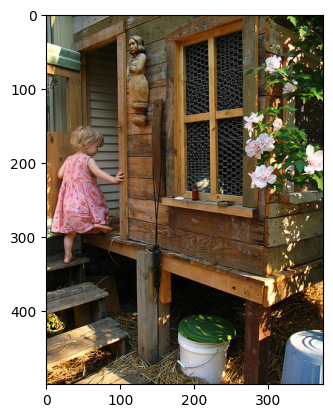

In [ ]:
# Visualise images & text present in the dataset

# Open the captions file in read mode
with open(CAPTIONS_FILE,'r') as f:
  # Read the entire content of the file
  txt = f.read()
  f.close()

# Print the first 414 characters of the text to get a preview
print(txt[:414])
# Extract the filename from the first line of the text
file_name = re.split(r'[,\n]', txt[:100])[2]

# Read the image using its path and display it
plt.imshow(mpimg.imread(os.path.join(IMAGES_DIR, file_name)))
plt.show()

In [ ]:
# Import the dataset and read the text file into a seperate variable

with open(CAPTIONS_FILE,'r') as f:
    text = [line.rstrip() for line in f]
f.close()

print(len(text))

text[1:10]

40456


['1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg,A girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .',
 '1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting',
 '1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .',
 '1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .',
 '1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .']

Create a dataframe which summarizes the image, path & captions as a dataframe

Each image id has 5 captions associated with it therefore the total dataset should have 40455 samples.

In [ ]:
all_img_id= [line.split(',')[0] for line in text[1:]]                                 #store all the image id here
all_img_vector= [os.path.join(IMAGES_DIR,line.split(',')[0]) for line in text[1:]]    #store all the image path here
annotations= [line.split(',')[1] for line in text[1:]]                                #store all the captions here

df = pd.DataFrame(list(zip(all_img_id, all_img_vector,annotations)),columns =['ID','Path', 'Captions'])

df

,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,/content/Images/1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,/content/Images/1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,/content/Images/1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,/content/Images/1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,/content/Images/1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...,...
40450,997722733_0cb5439472.jpg,/content/Images/997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,/content/Images/997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,/content/Images/997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,/content/Images/997722733_0cb5439472.jpg,A rock climber in a red shirt .


### Create annotations and all_img_path lists

In [ ]:
# Create a list which contains all the captions
annotations= df['Captions'].tolist()

# add the <start> & <end> token to all those captions as well
annotations = ['<start> ' + a + ' <end>' for a in annotations]

# Create a list which contains all the path to the images
all_img_path = df['Path'].tolist()

print("Total captions present in the dataset: "+ str(len(annotations)))
print("Total images present in the dataset: " + str(len(all_img_path)))

Total captions present in the dataset: 40455
Total images present in the dataset: 40455


In [ ]:
# Create the vocabulary & the counter for the captions

vocab = {}

for a in df['Captions']:
  for w in a.split():
    if w in vocab:
      vocab[w] += 1
    else:
      vocab[w] = 1

# df from dict
vocab_df = pd.DataFrame.from_dict(vocab, orient='index', columns=['count'])
vocab_df.head(20)

# sort
vocab_df = vocab_df.sort_values(by=['count'], ascending=False)

print(f"Size of Vocabulary: ",  len(vocab_df.index))
print(f"Top 30 Words in Vocabulary:", vocab_df.head(20))

Size of Vocabulary:  9536
Top 30 Words in Vocabulary:        count
a      38716
.      34205
A      21480
in     18170
the    14587
on     10354
is      9069
and     8057
dog     7804
with    7303
man     6727
of      6495
Two     3962
white   3646
black   3491
boy     3395
are     3364
girl    3174
woman   3146
to      3005


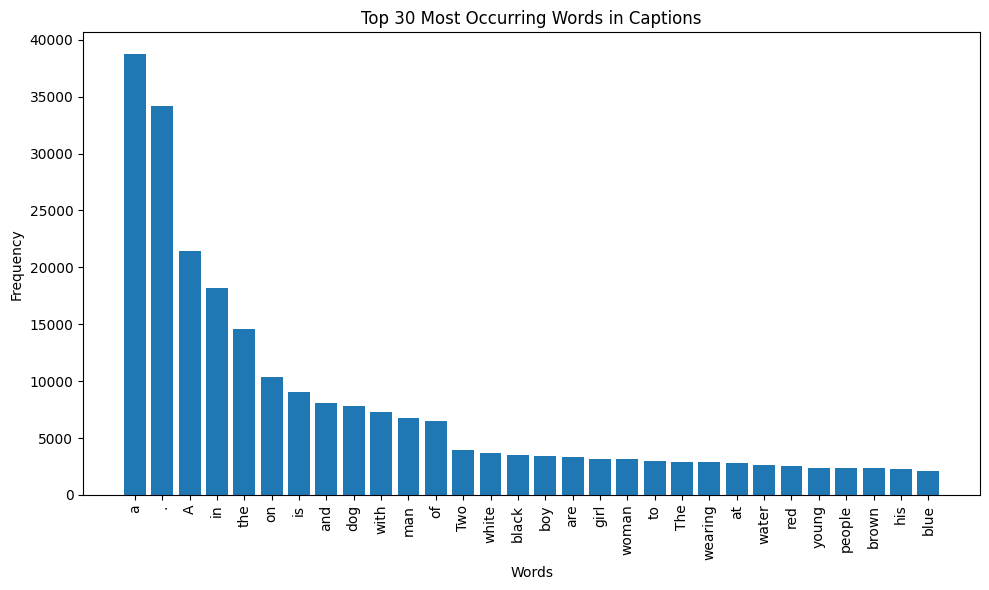

In [ ]:
# Visualise the top 30 occuring words in the captions

# Get the top 30 words and their counts
top_30_words = vocab_df.head(30)

# Create the bar plot using matplotlib
plt.figure(figsize=(10, 6))
plt.bar(top_30_words.index, top_30_words['count'])
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 30 Most Occurring Words in Captions')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Pre-Processing the captions
1.Create the tokenized vectors by tokenizing the captions fore ex :split them using spaces & other filters.
This gives us a vocabulary of all of the unique words in the data. Keep the total vocaublary to top 5,000 words for saving memory.

2.Replace all other words with the unknown token "UNK" .

3.Create word-to-index and index-to-word mappings.

4.Pad all sequences to be the same length as the longest one.

In [ ]:
# create the tokenizer

text_vectorizer = tf.keras.layers.TextVectorization(max_tokens=5000,      # Max vocabulary size
                                                    standardize='lower')

text_vectorizer.adapt(annotations)
print("Vocabulary size is: ", text_vectorizer.vocabulary_size())

cap_tensors = text_vectorizer(annotations)
print("Shape of tokenized text is: ", cap_tensors.shape)

Vocabulary size is:  5000
Shape of tokenized text is:  (40455, 36)


In [ ]:
# Create word-to-index and index-to-word mappings.

# Get vocabulary
vocab = text_vectorizer.get_vocabulary()

# Create word -> index mapping
word_to_index = {word: index for index, word in enumerate(vocab)}

# Create index -> word mapping
index_to_word = {index: word for index, word in enumerate(vocab)}

# Function to get token for a given word
def get_word(token):
  word = index_to_word[token.numpy()]
  return word

# Function to get word for a given token
def get_token(word):
  token = word_to_index[word]
  return token

In [ ]:
# Function to get word for a given token
def get_token(word):
  token = word_to_index[word]
  return token

# Function to get token for a given word
def get_word(token):
  word = index_to_word[token]
  return word

# Test functions
print("Token for 'girl':", get_token('girl'))
print("Word for token 21:", get_word(21))

Token for 'girl': 21
Word for token 21: girl


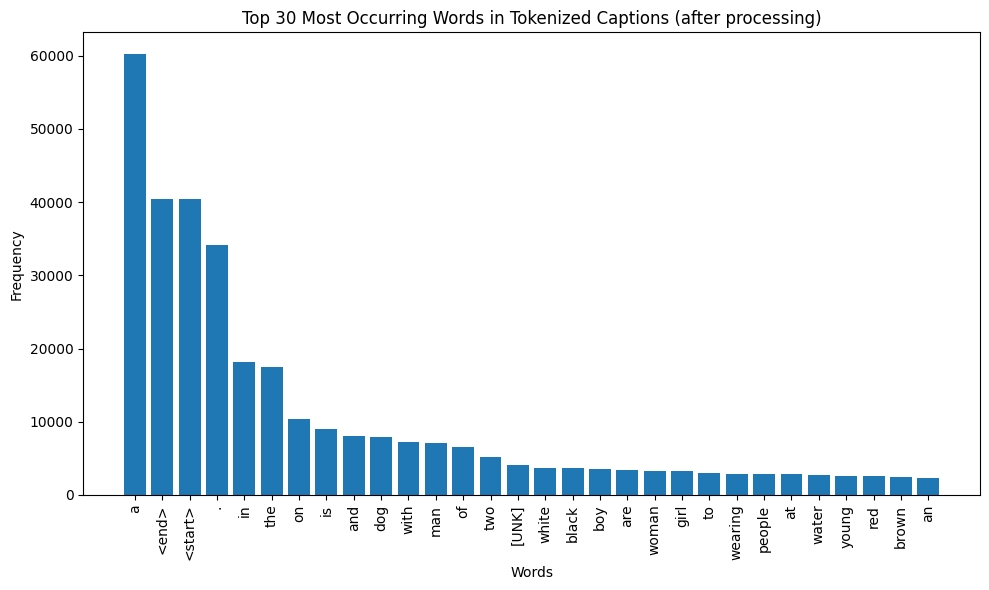

In [ ]:
# Create a word count of your tokenizer to visulize the Top 30 occuring words after text processing

# Get the vocabulary from the text vectorizer
vocab_after_processing = text_vectorizer.get_vocabulary() # do not get special tokens

# Create a frequency distribution of words in the tokenized captions
word_counts_after_processing = {}
for caption in cap_tensors:
  for token in caption:
    word = get_word(token.numpy())
    if word != '':
      if word in word_counts_after_processing:
        word_counts_after_processing[word] += 1
      else:
        word_counts_after_processing[word] = 1

# Create a DataFrame from the word counts
vocab_df_after_processing = pd.DataFrame.from_dict(word_counts_after_processing, orient='index', columns=['count'])

# Sort the DataFrame by count in descending order
vocab_df_after_processing = vocab_df_after_processing.sort_values(by=['count'], ascending=False)

# Get the top 30 words and their counts
top_30_words_after_processing = vocab_df_after_processing.head(30)

# Create the bar plot using matplotlib
plt.figure(figsize=(10, 6))
plt.bar(top_30_words_after_processing.index, top_30_words_after_processing['count'])
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 30 Most Occurring Words in Tokenized Captions (after processing)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
# verify that the vector is correctly padded by the tokeniser

cap_tensors[0:10]

<tf.Tensor: shape=(10, 36), dtype=int64, numpy=
array([[   3,    2,   45,    6,    2,   91,  175,    9,  119,   55,    2,
         398,   14,  389,    6,   30,    1,  696,    5,    4,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0],
       [   3,    2,   21,  317,   66,    2,  197,  121,    5,    4,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0],
       [   3,    2,   39,   21,  119,   66,    2,  197, 2474,    5,    4,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0],
       [   3,    2,   39,   21,  119,    7,  389,   22,   65, 2474,    5,
           4,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,  

In [ ]:
# Test by recreating a sentence from vector

print(annotations[0])
print('\n')
print(cap_tensors[0])
print('\n')
print(' '.join([str(get_word(token.numpy())) for token in cap_tensors[0]]))

<start> A child in a pink dress is climbing up a set of stairs in an entry way . <end>


tf.Tensor(
[  3   2  45   6   2  91 175   9 119  55   2 398  14 389   6  30   1 696
   5   4   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0], shape=(36,), dtype=int64)


<start> a child in a pink dress is climbing up a set of stairs in an [UNK] way . <end>                


## Pre-processing the images

1.Resize them into the shape of (299, 299)

3.Normalize the image within the range of -1 to 1, such that it is in correct format for InceptionV3.

In [ ]:
# Create the dataset consisting of image paths

all_img_path_nodupes = list(dict.fromkeys(all_img_path))  # remove duplicates and preserve order
print("Number of images: ", len(all_img_path_nodupes))

image_dataset = tf.data.Dataset.from_tensor_slices(all_img_path_nodupes)

image_dataset


Number of images:  8091


<_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

In [ ]:
# Function to load images

def load_image(file_path):
    """
    Loads an image from the specified file path, decodes and resizes it, and applies InceptionV3 preprocessing.

    Parameters:
        file_path (str): Path to the image file.

    Returns:
        tuple: A tuple of (file_path, preprocessed_image), where preprocessed_image is a float32 tensor
            of shape (299, 299, 3), ready for use with InceptionV3 models.

    The function performs the following steps:
      - Reads the image file from disk.
      - Decodes the JPEG-encoded image to an RGB tensor.
      - Resizes the image to 299x299 pixels.
      - Applies InceptionV3-specific preprocessing (scales pixels to [-1, 1]).
    """
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, [299, 299])

    image = tf.keras.applications.inception_v3.preprocess_input(image)  # pre-process for inception_v3
                                                                        # The inputs pixel values are scaled between -1 and 1, sample-wise.

    return file_path, image

In [ ]:
# Apply the function to the image path dataset, such that the transformed dataset should contain images & their path

image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

image_dataset = image_dataset.batch(32).prefetch(tf.data.AUTOTUNE)

image_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None,), dtype=tf.string, name=None), TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None))>

## Load the pretrained Imagenet weights of Inception net V3

1.To save the memory(RAM) from getting exhausted, extract the features of the images using the last layer of pre-trained model. Including this as part of training will lead to higher computational time.

2.The shape of the output of this layer is 8x8x2048.

3.Use a function to extract the features of each image in the train & test dataset such that the shape of each image should be (batch_size, 8*8, 2048)



In [ ]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

new_input =  image_model.input                # get the input of the image_model
hidden_layer = image_model.layers[-1].output  # get the output of the image_model

inceptionv3_feature_extractor = tf.keras.Model(new_input, hidden_layer, name="inceptionv3_feature_extractor") # build the final model using both input & output layer

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# inceptionv3_feature_extractor.summary()

In [ ]:
# Apply the feature_extraction model to earlier created dataset which contained images & their respective paths
# Once the features are created, reshape them such that feature shape is in order of (batch_size, 8*8, 2048)

from tqdm import tqdm

image_tensors_dict = {}

for path, image in tqdm(image_dataset):
  image_tensor = inceptionv3_feature_extractor(image)
  image_tensor = tf.reshape(image_tensor, (image_tensor.shape[0], -1, image_tensor.shape[3]))

  for i in range(image_tensor.shape[0]):
    image_tensors_dict[path[i].numpy().decode("utf-8")] = image_tensor[i].numpy()

len(image_tensors_dict)

100%|██████████| 253/253 [01:47<00:00,  2.36it/s]


8091

Store the features using a dictionary with the path as the key and values as the feature extracted by the inception net v3 model

## Dataset creation
1.Apply train_test_split on both image path & captions to create the train & test list. Create the train-test spliit using 80-20 ratio & random state = 42

2.Create a function which maps the image path to their feature.

3.Create a builder function to create train & test dataset & apply the function created earlier to transform the dataset

2.Make sure you have done Shuffle and batch while building the dataset

3.The shape of each image in the dataset after building should be (batch_size, 8*8, 2048)

4.The shape of each caption in the dataset after building should be(batch_size, max_len)


<start> a child in a pink dress is climbing up a set of stairs in an [UNK] way . <end>                
/content/Images/1000268201_693b08cb0e.jpg


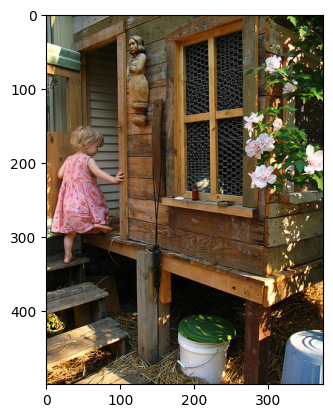

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.1698324 ]
 [0.         0.         1.0108178  ... 0.         0.         0.06111062]
 ...
 [0.         0.         2.0380003  ... 1.2029786  0.         1.9922142 ]
 [0.         0.         0.90447885 ... 0.         0.         0.        ]
 [0.         1.25253    0.         ... 0.         0.         0.        ]]
####################################################################################################


<start> a black dog and a spotted dog are fighting <end>                         
/content/Images/1001773457_577c3a7d70.jpg


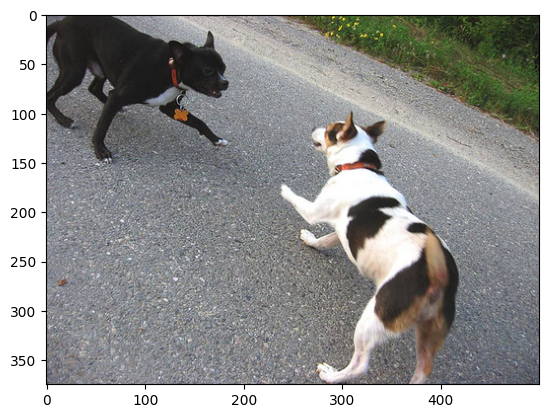

[[0.         0.6635561  0.46302307 ... 0.         0.         3.3320842 ]
 [0.         1.22681    0.         ... 0.         0.2540195  3.3293462 ]
 [1.2881583  1.5197146  0.         ... 0.46769983 0.3647658  3.817007  ]
 ...
 [0.33705682 2.8778582  0.         ... 0.         1.0883942  0.        ]
 [0.20821725 1.0365574  0.         ... 0.         0.5745572  0.        ]
 [0.         0.5454589  0.         ... 0.         0.27567488 0.        ]]
####################################################################################################




In [ ]:
# check caption to image path to image mapping

for i in range(0,10,5):
  print(' '.join([str(get_word(token.numpy())) for token in cap_tensors[i]]))
  print(all_img_path[i])

  plt.imshow(mpimg.imread(all_img_path[i]))
  plt.show()

  print(image_tensors_dict[all_img_path[i]])

  print("#"*100)
  print('\n')

In [ ]:
# train-test split

path_train, path_test, cap_train, cap_test = train_test_split(all_img_path, cap_tensors.numpy(), test_size=0.2, random_state=42)

In [ ]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(cap_train)))
print("Testing data for Captions: " + str(len(cap_test)))

Training data for images: 32364
Testing data for images: 8091
Training data for Captions: 32364
Testing data for Captions: 8091


In [ ]:
# Create a function which maps the image path to their feature.

def map_func(image_path, caption_tensor):
    """
    Retrieves the precomputed image tensor from a dictionary based on the image file path and returns it with the caption tensor.

    Parameters:
        image_path (str): A byte string tensor containing the path to the image file.
        caption_tensor (tf.Tensor): A tensor representing the encoded image caption.

    Returns:
        tuple: (img_tensor, caption_tensor), where img_tensor is the pre-extracted feature tensor for the image,
               and caption_tensor is the input caption tensor.

    The function decodes the image path to a UTF-8 string, looks up the corresponding image features in the image tensors dictionary,
    and pairs them with the provided caption tensor.
    """
    img_tensor = image_tensors_dict[image_path.decode('utf-8')]  # extract the features from the dictionary stored earlier
    return img_tensor, caption_tensor


Load the features using the dictionary created earlier

In [ ]:
# create a builder function to create dataset which takes in the image path & captions as input
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier

def gen_dataset(image_paths_list, caption_tensor_list, batch_size, buffer_size=1000):
    """
    Creates a TensorFlow dataset by pairing image paths with their caption tensors and mapping them to (features, caption) using a feature extraction mapping function.

    Parameters:
        image_paths_list (list or array-like): List of image file paths.
        caption_tensor_list (list or array-like): List of integer-encoded or tensorized captions corresponding to images.
        batch_size (int): Batch size for training or evaluation.
        buffer_size (int, optional): Buffer size for shuffling and prefetching. Defaults to 1000.

    Returns:
        tf.data.Dataset: A dataset yielding batches of (image_feature_tensor, caption_tensor) tuples, ready for model consumption.

    The dataset performs the following steps:
      - Creates a dataset from (image_path, caption) pairs.
      - Maps each pair to (image_feature, caption) using a custom mapping function via tf.numpy_function.
      - Shuffles, batches, and prefetches the data for efficient training.
    """

    dataset = tf.data.Dataset.from_tensor_slices((image_paths_list, caption_tensor_list))

    dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int64]),
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)

    dataset = dataset.shuffle(1000).batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset



In [ ]:
BATCH_SIZE = 64   # set batch size

train_dataset = gen_dataset(path_train, cap_train, BATCH_SIZE)
test_dataset = gen_dataset(path_test, cap_test, BATCH_SIZE)

In [ ]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)   #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape)   #(batch_size,max_len)

(64, 64, 2048)
(64, 36)


The output shape (batch_size, 8, 8, 2048) from Inception V3 (with top removed) means:

- batch_size: Number of images passed together in one batch (typically set by the user during training or inference).

- 8 × 8: Spatial dimensions of the feature map. Each image is reduced to an 8-by-8 spatial grid by the convolutions and pooling layers of the network. Each cell in this grid corresponds to a receptive field in the original image and represents learned information about a part of the input.

- 2048: Number of channels (or depth) in each spatial location. Each channel contains different learned feature activations, representing different patterns, shapes, or abstract concepts the network considers relevant for the input.

- The model has extracted 2048 different feature types at each position in an 8x8 grid over the image.

- Each position in the 8x8 grid covers a different region (receptive field) of the input image, allowing the network to summarize complex spatial information at multiple depths.

- Together, this 3D tensor (ignoring batch) encodes high-level visual features for each image, ready for further pooling or classification.

In summary, "8x8" is the reduced spatial map of the image and "2048" is the number of feature channels (filters) learned by the deepest layers of Inception V3.

## Model Building
1.Set the parameters

2.Build the Encoder, Attention model & Decoder

In [ ]:
embedding_dim = 256
units = 512
vocab_size = 5001     #top 5,000 words +1
train_num_steps = len(path_train) // BATCH_SIZE   #len(total train images) // BATCH_SIZE
test_num_steps = len(path_test) // BATCH_SIZE  #len(total test images) // BATCH_SIZE

### Encoder

In [ ]:
@tf.keras.utils.register_keras_serializable()
class Encoder(Model):
    """
    Encodes input image features to the specified embedding dimension using a dense layer with ReLU activation.

    Parameters:
        embed_dim (int): Dimension of the output embedding vector.

    Methods:
        call(features):
            Applies a Dense layer followed by a ReLU activation to the input features.

            Args:
                features (tf.Tensor): Input tensor of image features, typically of shape (batch_size, height*width, feature_dim).

            Returns:
                tf.Tensor: Transformed features tensor of shape (batch_size, height*width, embed_dim), where each feature vector is projected to the embedding dimension and passed through ReLU non-linearity.

    Usage:
        encoder = Encoder(embed_dim)
        encoded_features = encoder(features)
    """

    def __init__(self, embed_dim):
        super(Encoder, self).__init__()
        self.dense = self.dense = tf.keras.layers.Dense(embed_dim)    #build your Dense layer with relu activation

    def call(self, features):
        features_op =  self.dense(features)  # extract the features from the image shape: (batch, 8*8, embed_dim)
        features_op = tf.nn.relu(features_op)

        return features_op

In [ ]:
encoder = Encoder(embedding_dim)

### Attention model

In [ ]:
@tf.keras.utils.register_keras_serializable()
class Attention_model(tf.keras.Model):
    """
    Implements an attention mechanism that computes attention weights over image features
    given the current hidden state, producing a context vector emphasizing important features.

    Attributes:
        units (int): Number of units in the Dense layers used to calculate attention scores.
        W1 (tf.keras.layers.Dense): Dense layer applied to the image features.
        W2 (tf.keras.layers.Dense): Dense layer applied to the hidden state.
        V (tf.keras.layers.Dense): Final Dense layer with one unit to compute the attention scores.

    Methods:
        call(features, hidden):
            Computes the context vector and attention weights based on input features and hidden state.

    Args:
        features (tf.Tensor): Tensor containing image features, shape (batch_size, 8*8, embedding_dim).
        hidden (tf.Tensor): Tensor containing the hidden state from a previous decoder step, shape (batch_size, hidden_size).

    Returns:
        tuple:
            context_vector (tf.Tensor): Weighted sum of image features with shape (batch_size, embedding_dim),
                                        highlighting relevant spatial features.
            attention_weights (tf.Tensor): Attention weights over spatial features, shape (batch_size, 8*8, 1),
                                           representing the importance of each feature.

    Description:
        The model computes attention by first projecting image features and hidden states into a shared space,
        combining them via addition and nonlinear activation, then calculating scores which are normalized into weights.
        These weights modulate the features to create a context vector that dynamically focuses on relevant image parts
        during tasks like image captioning or visual question answering.
    """

    def __init__(self, units):
        super(Attention_model, self).__init__()

        self.W1 = tf.keras.layers.Dense(units) #build your Dense layer
        self.W2 = tf.keras.layers.Dense(units) #build your Dense layer
        self.V = tf.keras.layers.Dense(1) #build your final Dense layer with unit 1

        # Stores the number of units for the dense layers.
        self.units= units

    def call(self, features, hidden):
        #features shape: (batch_size, 8*8, embedding_dim)
        # hidden shape: (batch_size, hidden_size)

        # Expand the hidden state for broadcasting.
        hidden_with_time_axis =  tf.expand_dims(hidden, 1)  # shape: (batch_size, 1, hidden_size)

        # Computes a combined representation of features and hidden state using dense layers and a tanh activation
        attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                            self.W2(hidden_with_time_axis)))  # shape: (batch_size, 64, units)

        # Calculate the attention scores using the V layer.
        score = self.V(attention_hidden_layer)  # shape: (batch_size, 8*8, 1)

        # Apply a softmax function to get attention weights, indicating the importance of each image feature.
        attention_weights =  tf.nn.softmax(score,axis=1)  # shape: (batch_size, 8*8, 1)

        # Multiply the attention weights by the image features to get weighted features.
        context_vector =  attention_weights * features  # shape: (batch_size, 8*8,embedding_dim)

        # Sum the weighted features across the spatial dimension to get a single context vector for each image in the batch.
        context_vector =  tf.reduce_sum(context_vector, axis=1) # shape: (batch_size, embedding_dim)

        return context_vector, attention_weights

### Decoder

In [ ]:
@tf.keras.utils.register_keras_serializable()
class Decoder(tf.keras.Model):
    """
    Decoder model that generates sequences by attending to encoded image features and producing word predictions.

    Attributes:
        units (int): Number of units in GRU and attention dense layers.
        attention (Attention_model): Attention mechanism to compute context vectors.
        embed (tf.keras.layers.Embedding): Embedding layer to convert token indices to embeddings.
        gru (tf.keras.layers.GRU): GRU layer to process concatenated embeddings and context vectors.
        d1 (tf.keras.layers.Dense): Dense layer to transform GRU outputs before final projection.
        d2 (tf.keras.layers.Dense): Output Dense layer projecting to vocabulary size for word prediction probabilities.

    Methods:
        call(x, features, hidden):
            Processes input token x with image features and previous hidden state to compute output logits,
            updated hidden state, and attention weights.

        init_state(batch_size):
            Initializes the hidden state for the GRU as zeros.

    Args:
        embed_dim (int): Dimension of the token embedding vectors.
        units (int): Number of units in GRU and attention layers.
        vocab_size (int): Size of the target vocabulary.

    Inputs to call():
        x (tf.Tensor): Input token tensor of shape (batch_size, sequence_length) typically with sequence_length=1 during training.
        features (tf.Tensor): Encoded image features of shape (batch_size, spatial_features, embedding_dim).
        hidden (tf.Tensor): Previous hidden state tensor of shape (batch_size, units).

    Returns:
        tuple:
            output (tf.Tensor): Logits tensor of shape (batch_size * sequence_length, vocab_size) with raw predictions for next tokens.
            state (tf.Tensor): Updated hidden state tensor of shape (batch_size, units).
            attention_weights (tf.Tensor): Attention weights over features, shape (batch_size, spatial_features, 1).

    Description:
        The decoder uses an attention mechanism to focus on relevant parts of the encoded image features.
        It concatenates the context vector from attention with the embedded input token,
        processes it through a GRU layer, and then projects the output into the vocabulary space
        to predict the next word in the sequence.
    """

    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units= units
        self.attention = Attention_model(self.units)  #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embedding_dim) #build your Embedding layer
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True, recurrent_initializer='glorot_uniform',
                                       reset_after=False  # Disables CuDNN-specific behavior - since behaiviour is different when this runs on CPU vs GPU
                                       )
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer


    def call(self, x, features, hidden):

        context_vector, attention_weights = self.attention(features, hidden)  #create your context vector & attention weights from attention model
        embed =  self.embed(x)  # embed your input to shape: (batch_size, 1, embedding_dim)
        embed =  tf.concat([tf.expand_dims(context_vector, 1), embed], axis=-1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)

        output, state = self.gru(embed, initial_state=hidden)  # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)

        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
decoder = Decoder(embedding_dim, units, vocab_size)

**Test encoder and decoder using a sample batch**

In [ ]:
# Pass a batch of sample image tensors (sample_img_batch) through the encoder model.
# The encoder extracts relevant features from the images.
# The expected output shape is (batch, 8*8, embed_dim), where batch is the batch size,
# 8*8 represents the spatial dimensions after processing by the InceptionV3 model,
# and embed_dim is the embedding dimension defined earlier.
features = encoder(sample_img_batch)

# Prepare variable to initialize the hidden state of the decoder's GRU layer.
# The hidden state is initialized with zeros and its shape is (batch_size, units),
# where units is the number of units in the GRU layer.
hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])

# Prepare the initial input for the decoder.
# Create a tensor of shape (batch_size, 1) where each element is the token ID for the special <start> token.
# This is the first input to the decoder, indicating the beginning of a caption.
decoder_input = tf.expand_dims([get_token('<start>')] * sample_cap_batch.shape[0], 1)

# This is the core of the decoder's forward pass.
# It takes the initial decoder input (decoder_input), the image features from the encoder (features),
# and the initial hidden state (hidden) as input. The decoder then processes this information to generate:
#       predictions: The predicted probability distribution over the vocabulary for the next word in the caption.
#                     The shape is (batch_size, vocab_size).
#       hidden_out: The updated hidden state of the decoder's GRU layer.
#       attention_weights: The attention weights, indicating which parts of the image the model is focusing on at each step.
#                         The shape is (batch, 8*8, embed_dim).
predictions, hidden_out, attention_weights = decoder(decoder_input, features, hidden)

print('\n')
print('Overall Shapes: ')
print('   Shape of sample_img_batch: {}'.format(sample_img_batch.shape))
print('   Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('   Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('   Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim)



Overall Shapes: 
   Shape of sample_img_batch: (64, 64, 2048)
   Feature shape from Encoder: (64, 64, 256)
   Predcitions shape from Decoder: (64, 5001)
   Attention weights shape from Decoder: (64, 64, 1)


In [ ]:
print("Encoder Summary:")
encoder.summary()

print("\nAttention Model Summary:")
decoder.attention.summary()

print("\nDecoder Summary:")
decoder.summary()

Encoder Summary:


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (64, 64, 256)          │       524,544 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 524,544 (2.00 MB)

 Trainable params: 524,544 (2.00 MB)

 Non-trainable params: 0 (0.00 B)


Attention Model Summary:


Model: "attention_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (64, 64, 512)          │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (64, 1, 512)           │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (64, 64, 1)            │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 394,753 (1.51 MB)

 Trainable params: 394,753 (1.51 MB)

 Non-trainable params: 0 (0.00 B)


Decoder Summary:


Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ attention_model                 │ ?                      │       394,753 │
│ (Attention_model)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (64, 1, 256)           │     1,280,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ ((64, 1, 512), (64,    │     1,574,400 │
│                                 │ 512))                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (64, 1, 512)           │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (64, 5001)             │     2,565,513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,077,578 (23.18 MB)

 Trainable params: 6,077,578 (23.18 MB)

 Non-trainable params: 0 (0.00 B)

## Model training & optimization
1.Set the optimizer & loss object

2.Create your checkpoint path

3.Create your training & testing step functions

4.Create your loss function for the test dataset

In [ ]:
optimizer = tf.keras.optimizers.Adam() # define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none') # define the loss object

In [ ]:
def loss_function(real, pred):
    """
    Computes the masked loss between true labels and predictions, ignoring padding tokens.

    Parameters:
        real (tf.Tensor): Ground truth tensor of integer token indices, where 0 represents padding.
        pred (tf.Tensor): Predicted logits or probabilities tensor from the model.

    Returns:
        tf.Tensor: Scalar tensor representing the average loss over non-padded tokens.

    Description:
        This function calculates the loss using a predefined loss_object
        It creates a mask to exclude positions where the true label is 0 (padding).
        The loss values at padding positions are set to zero by multiplying with the mask.
        Finally, it returns the mean loss over the unmasked (valid) positions only.
    """

    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

In [ ]:
checkpoint_path = "/content/checkpoint"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

* While creating the training step for your model, apply Teacher forcing.
* Teacher forcing is a technique where the target/real word is passed as the next input to the decoder instead of previous prediciton.

In [ ]:
@tf.function
def train_step(img_tensor, target):
    """
    Executes one training step for an image captioning model consisting of an encoder and decoder.

    Parameters:
        img_tensor (tf.Tensor): Batch tensor of encoded image inputs/features, shape (batch_size, feature_dims).
        target (tf.Tensor): Batch tensor of target caption sequences as integer token indices, shape (batch_size, max_caption_length).

    Returns:
        tuple:
            loss (tf.Tensor): Scalar tensor representing the cumulative loss for this batch before averaging.
            avg_loss (tf.Tensor): Scalar tensor representing the average loss per caption token in this batch.

    Description:
        This function performs the following steps:
          - Initializes the hidden state of the decoder.
          - Sets the decoder input to the token representing the start of the sequence.
          - Within a GradientTape context, it encodes the images, then iteratively predicts each token in the target sequence using teacher forcing.
          - Computes the loss for each predicted token against the true token, accumulating the total loss.
          - Calculates gradients of the loss with respect to trainable model variables.
          - Applies the gradients to update the encoder and decoder parameters via the optimizer.
          - Returns both the summed loss and average loss over the sequence length for logging or monitoring.

        The function is decorated with @tf.function for improved performance via graph execution in TensorFlow.
    """

    # Initialize total loss for the batch
    loss = 0

    # Initialize the decoder hidden state with zeros, matching the batch size
    hidden = decoder.init_state(batch_size=target.shape[0])
    # Prepare the initial decoder input as the start token, expanded for batch processing
    dec_input = tf.expand_dims([get_token('<start>')] * target.shape[0], 1)

    # Record operations for automatic differentiation
    with tf.GradientTape() as tape:

        # Pass the input image tensor through the encoder to extract features
        features = encoder(img_tensor)

        # Loop over each time step in the target sequence (starting from 1 as 0 is start token)
        for i in range(1,target.shape[1]):

            # Use the decoder to get predictions, updated hidden state, and attention weights
            predictions,hidden,_ = decoder(dec_input,features,hidden)

            # Calculate loss for the current time step comparing true and predicted tokens
            loss += loss_function(target[:,i], predictions)

            # TEACHER FORCING: use the true token as the next input to the decoder
            dec_input = tf.expand_dims(target[:, i], 1)

        # Compute average loss per target token for the batch
        avg_loss = (loss / int(target.shape[1]))
        # Combine trainable variables from both encoder and decoder
        trainable_variables = encoder.trainable_variables + decoder.trainable_variables

        # Calculate gradients of loss with respect to trainable variables
        gradients = tape.gradient(loss, trainable_variables)
        # Apply gradients to update model parameters using optimizer
        optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, avg_loss

* While creating the test step for your model, you will pass your previous prediciton as the next input to the decoder.

In [ ]:
@tf.function
def test_step(img_tensor, target):
    """
    Performs one evaluation step for the image captioning model without teacher forcing.

    Parameters:
        img_tensor (tf.Tensor): Batch tensor of encoded image inputs/features, shape (batch_size, feature_dims).
        target (tf.Tensor): Batch tensor of target caption sequences as integer token indices, shape (batch_size, max_caption_length).

    Returns:
        tuple:
            loss (tf.Tensor): Scalar tensor representing the cumulative loss over this batch before averaging.
            avg_loss (tf.Tensor): Scalar tensor representing the average loss per token in the batch.

    Description:
        This function runs the decoder in inference mode, predicting the next token based on its own previous output rather than the true target token.
        Steps performed include:
          - Initializing the hidden state of the decoder.
          - Setting the decoder input to the start token.
          - Iteratively generating predictions for each token position by feeding back the predicted token as the next input.
          - Computing the loss at each step against the true token for evaluation metrics.
          - Returning the total and average losses for the entire sequence length.

        The function uses @tf.function decorator for performance optimization by TensorFlow graph execution.
    """

    # Initialize total loss for the batch
    loss = 0

    # Initialize the decoder's hidden state with zeros using the batch size
    hidden = decoder.init_state(batch_size=target.shape[0])
    # Prepare the initial decoder input with the <start> token for all samples in the batch
    dec_input = tf.expand_dims([get_token('<start>')] * target.shape[0], 1)

    # Record operations for automatic differentiation
    with tf.GradientTape() as tape:

        # Extract features from the input image tensor using the encoder
        features = encoder(img_tensor)

        # Loop over the sequence length from time step 1 onwards (excluding the initial <start> token)
        for i in range(1,target.shape[1]):

            # Pass current input, image features, and hidden state to the decoder to get predictions and updated hidden state
            predictions,hidden,_ = decoder(dec_input, features, hidden)
            # Compute loss comparing the true target token at time step i and the decoder's predictions
            loss += loss_function(target[:,i], predictions)

            # NO TEACHER FORCING: Instead of feeding ground truth token as next input,
            # use the decoder's predicted token from the current time step as the next input
            predicted_id = tf.argmax(predictions,1)
            dec_input = tf.expand_dims(predicted_id, 1)

    # Calculate the average loss per token in the target sequence
    avg_loss = (loss / int(target.shape[1]))

    return loss, avg_loss

In [ ]:
def test_loss_cal(test_dataset):
    """
    Calculates the average loss over the entire test dataset using the test_step function.

    Parameters:
        test_dataset (tf.data.Dataset): A dataset yielding batches of (image_tensor, target_caption) pairs for evaluation.

    Returns:
        tf.Tensor: Scalar tensor representing the average loss over all batches in the test dataset.

    Description:
        The function iterates through all batches in the test dataset, computes the loss for each batch
        using the test_step function, accumulates the batch losses, and then returns the average loss
        normalized by the number of test steps.
    """

    total_loss = 0

    # Get the average loss result on test data
    for (batch,(img_tensor,target)) in enumerate(test_dataset):
        batch_loss,t_loss = test_step(img_tensor,target)
        total_loss += t_loss
    return total_loss/test_num_steps

**Train the model**

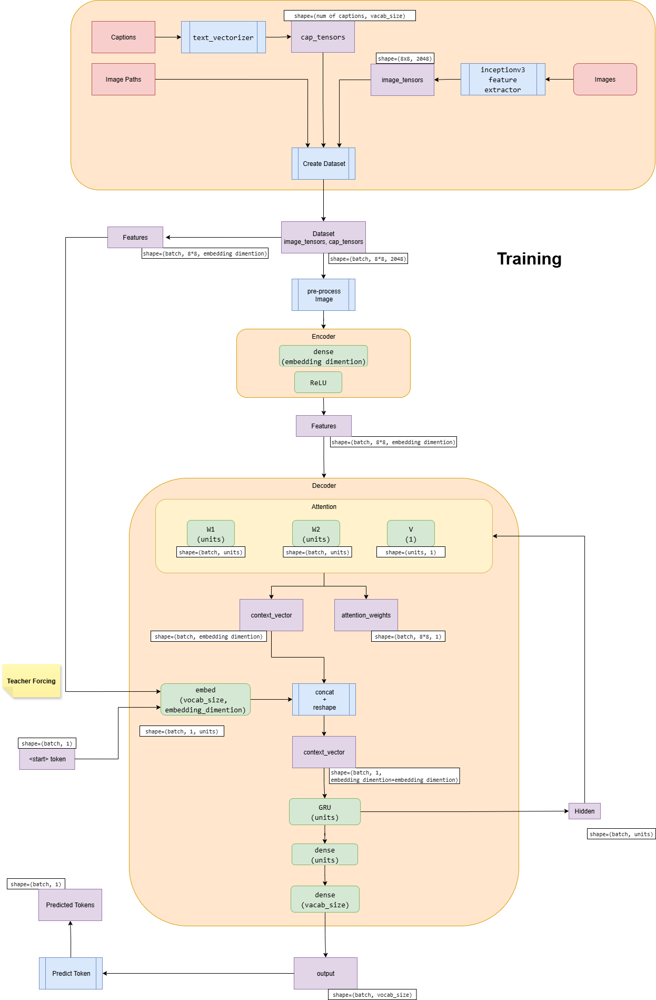

In [ ]:
loss_plot = []              # List to store average training loss after each epoch
test_loss_plot = []         # List to store test loss after each epoch
EPOCHS = 15                 # Number of training epochs

best_test_loss=100
for epoch in tqdm(range(EPOCHS)):
    start = time.time()   # Record start time of the epoch
    total_loss = 0        # Initialize total loss for the epoch

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)   # Perform a training step
        total_loss += t_loss                                  # Accumulate the loss
        avg_train_loss=total_loss / train_num_steps           # Calculate average training loss so far

    loss_plot.append(avg_train_loss)          # Record average training loss for this epoch
    test_loss = test_loss_cal(test_dataset)   # Calculate loss on the test dataset
    test_loss_plot.append(test_loss)          # Record test loss for this epoch

    # Print training and test loss data along with time taken for this epoch
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1, avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

    # Check if the test loss improved, and save a checkpoint if it has
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/15 [00:00<?, ?it/s]

For epoch: 1, the train loss is 1.267, & test loss is 2.436
Time taken for 1 epoch 181.01527333259583 sec

Test loss has been reduced from 100.000 to 2.436


 13%|█▎        | 2/15 [04:41<29:00, 133.86s/it]

For epoch: 2, the train loss is 0.950, & test loss is 2.505
Time taken for 1 epoch 100.62126159667969 sec



 20%|██        | 3/15 [06:21<23:40, 118.40s/it]

For epoch: 3, the train loss is 0.836, & test loss is 2.462
Time taken for 1 epoch 99.99094152450562 sec



 27%|██▋       | 4/15 [08:02<20:22, 111.17s/it]

For epoch: 4, the train loss is 0.755, & test loss is 2.527
Time taken for 1 epoch 100.08978247642517 sec



 33%|███▎      | 5/15 [09:42<17:54, 107.47s/it]

For epoch: 5, the train loss is 0.682, & test loss is 2.614
Time taken for 1 epoch 100.91350030899048 sec



 40%|████      | 6/15 [11:23<15:46, 105.20s/it]

For epoch: 6, the train loss is 0.613, & test loss is 2.737
Time taken for 1 epoch 100.80010294914246 sec



 47%|████▋     | 7/15 [13:04<13:49, 103.63s/it]

For epoch: 7, the train loss is 0.546, & test loss is 2.951
Time taken for 1 epoch 100.39738869667053 sec



 53%|█████▎    | 8/15 [14:43<11:56, 102.37s/it]

For epoch: 8, the train loss is 0.484, & test loss is 3.116
Time taken for 1 epoch 99.67848181724548 sec



 60%|██████    | 9/15 [16:23<10:08, 101.46s/it]

For epoch: 9, the train loss is 0.427, & test loss is 3.339
Time taken for 1 epoch 99.4447021484375 sec



 67%|██████▋   | 10/15 [18:02<08:24, 100.88s/it]

For epoch: 10, the train loss is 0.378, & test loss is 3.573
Time taken for 1 epoch 99.58390235900879 sec



 73%|███████▎  | 11/15 [19:42<06:41, 100.38s/it]

For epoch: 11, the train loss is 0.337, & test loss is 3.798
Time taken for 1 epoch 99.2468204498291 sec



 80%|████████  | 12/15 [21:20<04:59, 99.88s/it] 

For epoch: 12, the train loss is 0.301, & test loss is 4.040
Time taken for 1 epoch 98.73419189453125 sec



 87%|████████▋ | 13/15 [23:00<03:19, 99.70s/it]

For epoch: 13, the train loss is 0.271, & test loss is 4.270
Time taken for 1 epoch 99.28867506980896 sec



 93%|█████████▎| 14/15 [24:38<01:39, 99.22s/it]

For epoch: 14, the train loss is 0.249, & test loss is 4.549
Time taken for 1 epoch 98.11893653869629 sec



100%|██████████| 15/15 [26:16<00:00, 105.12s/it]

For epoch: 15, the train loss is 0.230, & test loss is 4.722
Time taken for 1 epoch 98.56158399581909 sec



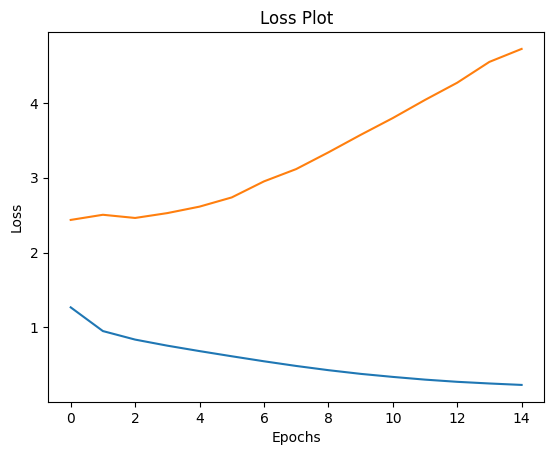

In [ ]:
plt.plot(loss_plot)
plt.plot(test_loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

**NOTE:**
* Since there is a difference between the train & test steps ( Presence of teacher forcing), we  observe that the train loss is decreasing while the test loss is not.
* This doesn't mean that the model is overfitting, as we can't compare the train & test results here, as both approach is different.
* Also, to achieve better results we can run it more epochs, but the intent of this capstone is to give you an idea on how to integrate attention mechanism with E-D architecture for images. The intent is not to create the state of art model.

## Model Evaluation
1.Define your evaluation function using greedy search

2.Define your evaluation function using beam search ( optional)

3.Test it on a sample data using BLEU score

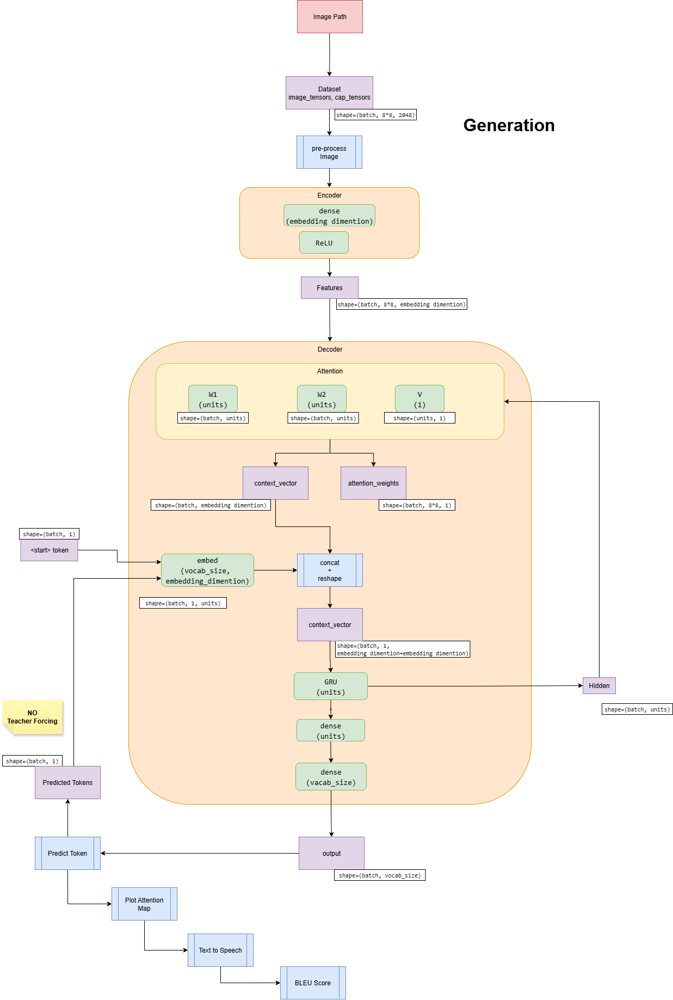

### Greedy Search

In [ ]:
def evaluate(file_name, images_dir=IMAGES_DIR):
    """
    Generates a caption for the given image using greedy search decoding on the encoder-decoder model.

    Parameters:
        file_name (str): Filename of the image to caption.
        images_dir (str, optional): Directory path containing the image files. Defaults to IMAGES_DIR.

    Returns:
        tuple:
            caption_list (list of str): The generated caption as a list of decoded tokens/words.
            attn_weights_list (list of np.array): Attention weights for each decoded token, showing focus on image features.
            predictions_list (list of tf.Tensor): Raw prediction logits from the decoder for each decoded step.

    Description:
        This function performs the following steps:
          - Constructs the full image path and loads and preprocesses the image.
          - Extracts image features using a pretrained InceptionV3 feature extractor.
          - Passes the features through the encoder to obtain encoded representations.
          - Initializes the decoder hidden state.
          - Iteratively generates tokens by passing the latest predicted token back to the decoder,
            using greedy search (selecting the most probable token at each step).
          - Stops decoding when the <end> token is predicted or the caption length reaches 40 tokens.
          - Collects the generated tokens, attention weights, and raw predictions at each time step.

        The function returns the generated caption tokens, attention weights, and prediction tensors,
        useful for both inference and visualization of the attention mechanism.
    """

    image_path = os.path.join(IMAGES_DIR, file_name)

    image_path, image = load_image(image_path)

    # Call inceptionv3_feature_extractor with the image
    image_tensor = inceptionv3_feature_extractor(tf.expand_dims(image, 0)) # add batch dimension

    # Pass the image features to the encoder
    features = encoder(image_tensor)

    # Initialize the decoder's hidden state
    hidden = decoder.init_state(batch_size=features.shape[0])

    predictions_list = []
    caption_list = []
    attn_weights_list = []

    # Prepare the initial input for the decoder (the <start> token)
    pred_token = get_token('<start>')

    while pred_token != get_token('<end>') and len(caption_list) < 40:

        decoder_input = tf.expand_dims([pred_token] * features.shape[0], 1)

        # Reshape the features tensor before passing it to the decoder
        features_reshaped = tf.reshape(features, (features.shape[0], -1, features.shape[3]))

        # Pass the features and initial input to the decoder
        predictions, hidden_out, attention_weights = decoder(decoder_input, features_reshaped, hidden)

        # Get the top 5 predicted word indices
        top_k_indices = tf.math.top_k(predictions, k=5).indices.numpy()[0]
        # Print the top 5 predicted words
        #print(' '*50, "Top 5: ", [str(get_word(w)) for w in top_k_indices])
        #
        pred_token = top_k_indices[0]
        #print("Prediction: ", ' '.join(caption_list))

        predictions_list.append(predictions)

        caption_list.append(get_word(pred_token))

        attn_weights_list.append(tf.squeeze(attention_weights).numpy()) # Append attention weights

        hidden = hidden_out

    return caption_list, attn_weights_list, predictions_list

In [ ]:
def plot_attmap(caption, weights, file_name, images_dir=IMAGES_DIR):
    """
    Visualizes the attention weights over an image for each word in the generated caption.

    Parameters:
        caption (list of str): List of words/tokens in the generated caption.
        weights (list or np.array): Attention weight arrays corresponding to each word,
                                    each of shape (64,) or reshaped to (8, 8).
        file_name (str): Filename of the image to be visualized.
        images_dir (str, optional): Directory path containing the image files. Defaults to IMAGES_DIR.

    Description:
        This function creates a matplotlib figure with subplots, each subplot showing the original image overlaid
        with the attention heatmap for a particular word in the caption. The heatmap highlights regions of the image
        the model focused on when generating that word.

        The attention weights are resized from (8, 8) to (224, 224) to match the displayed image size, and
        semi-transparent heatmaps are overlaid using the 'gist_heat' colormap. The subplots are arranged to
        fit half the caption length per row.

        This visualization helps interpret which parts of the image are attended to for each generated word.
    """

    print("\n")
    image_path = os.path.join(IMAGES_DIR, file_name)

    fig = plt.figure(figsize=(12, 12))
    temp_img = np.array(Image.open(image_path))

    # Get the length of the caption (number of words)
    len_cap = len(caption)

    # Loop over each word index in the caption
    for cap in range(len_cap):

        # Reshape the attention weights for the current word into an 8x8 matrix
        weights_img = np.reshape(weights[cap], (8,8))

        # Resize the weights image to match the size of the displayed image (224x224) for overlay
        weights_img = np.array(Image.fromarray(weights_img).resize((224, 224), Image.LANCZOS))

        ax = fig.add_subplot(len_cap//2, len_cap//2, cap+1)
        ax.set_title(caption[cap], fontsize=15)

        # Display the original image on the subplot
        img=ax.imshow(temp_img)

        # Overlay the attention heatmap on top of the image with semi-transparency
        ax.imshow(weights_img, cmap='gist_heat', alpha=0.6,extent=img.get_extent()
        )
        ax.axis('off')

    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    plt.show()

In [ ]:
def filt_text(text):
    """
    Removes specific special tokens from a list of text tokens and returns the cleaned text as a string.

    Parameters:
        text (list of str): List of text tokens which may include special tokens.

    Returns:
        str: A single string with the special tokens '<start>', '<unk>', and '<end>' removed and remaining tokens joined by spaces.

    Description:
        The function filters out the special tokens commonly used in NLP tasks to mark sequence start, unknown tokens,
        and sequence end. It then concatenates the remaining tokens into a readable sentence.
    """

    filt = ['<start>','<unk>','<end>']
    [text.remove(j) for k in filt for j in text if k==j]
    text=' '.join(text)
    return text

In [ ]:
def text_to_speech(file_name, caption, mp3_dir=MP3_DIR):
    """
    Converts a textual caption to speech audio using Google Text-to-Speech (gTTS) and saves it as an MP3 file.

    Parameters:
        file_name (str): Name of the original image file; used to derive the MP3 file name by replacing the extension.
        caption (list of str): List of text tokens representing the generated caption.
        mp3_dir (str, optional): Directory path where the MP3 file will be saved. Defaults to MP3_DIR.

    Description:
        The function first cleans the caption by removing special tokens using filt_text, then uses gTTS
        to generate spoken audio in English. The resulting MP3 file is saved in the specified directory
        with the same base filename as the input but with an ".mp3" extension. The saved audio file path
        and an audio player widget are displayed for playback in Jupyter Notebook environments.
    """

    # Language
    language = 'en'

    # Passing the text and language to the engine
    myobj = gTTS(text=filt_text(caption), lang=language, slow=False)

    mp3_file_name = os.path.join(MP3_DIR, file_name[16:-4] + ".mp3")

    # Saving the converted audio in a mp3 file named
    myobj.save(mp3_file_name)

    display(HTML(f"<b>{mp3_file_name}</b>"))
    display(Audio(mp3_file_name))

In [ ]:
def bleu_score(reference, candidate):
    """
    Calculate and print the BLEU scores for 1-gram, 2-gram, 3-gram, and 4-gram matches
    between a reference set of sentences and a candidate sentence using the sentence_bleu function.

    Parameters:
    reference (list of list of str): A list of reference sentences, where each reference sentence
                                     is a list of tokens (words).
    candidate (list of str): A candidate sentence represented as a list of tokens (words).

    Prints:
    Individual BLEU scores for 1-gram, 2-gram, 3-gram, and 4-gram, each multiplied by 100,
    which represent the precision of n-gram overlaps between the candidate and the references.
    """

    # Calculate BLEU score using 1-gram precision (individual words)
    score1 = sentence_bleu(reference, candidate, weights=(1,0,0,0))

    # Calculate BLEU score using 2-gram precision (pairs of consecutive words)
    score2 = sentence_bleu(reference, candidate, weights=(0,1,0,0))

    # Calculate BLEU score using 3-gram precision (triplets of consecutive words)
    score3 = sentence_bleu(reference, candidate, weights=(0,0,1,0))

    # Calculate BLEU score using 4-gram precision (quadruplets of consecutive words)
    score4 = sentence_bleu(reference, candidate, weights=(0,0,0,1))

    print("\nBELU score: ")
    print(f"Individual 1-gram: {score1*100}")
    print(f"Individual 2-gram: {score2*100}")
    print(f"Individual 3-gram: {score3*100}")
    print(f"Individual 4-gram: {score4*100}")

In [ ]:
def generate_caption(data):

    for file_name, act_caption in data:

        print("\n")
        display(HTML(f"<b><span style='font-size:18px; color:red;'>{"#"*100}</span></b>"))
        print("Processing file: ", file_name)

        # Display the image corresponding to the current file_name
        plt.figure(figsize=(4, 4))
        plt.imshow(mpimg.imread(os.path.join(IMAGES_DIR, file_name)))
        plt.show()

        # Generate caption, attention weights, and predictions for the input image
        caption, attn_weights_list, predictions_list = evaluate(file_name)

        # Filter out special tokens and print the predicted caption as styled HTML
        print("\n")

        print_cap= "   Actual Caption: " + act_caption
        display(HTML(f"<b><span style='font-size:16px; color:green;'>{print_cap}</span></b>"))
        print_cap= "Predicted Caption: " + ''.join(filt_text(caption))
        display(HTML(f"<b><span style='font-size:16px; color:blue;'>{print_cap}</span></b>"))

        # Visualize the attention maps over the image for each generated caption word
        plot_attmap(caption, attn_weights_list, file_name)

        # Convert the predicted caption text to speech and play the audio
        print("\n")
        text_to_speech(file_name, caption)
        print("\n")

        #BLEU score
        bleu_score(act_caption, ''.join(filt_text(caption)))

### Evaluation

Processing file:  /content/Images/1000268201_693b08cb0e.jpg


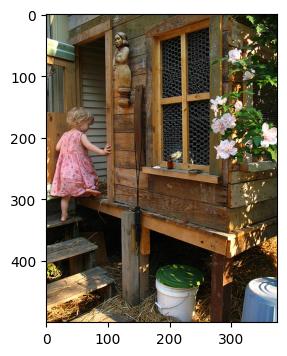

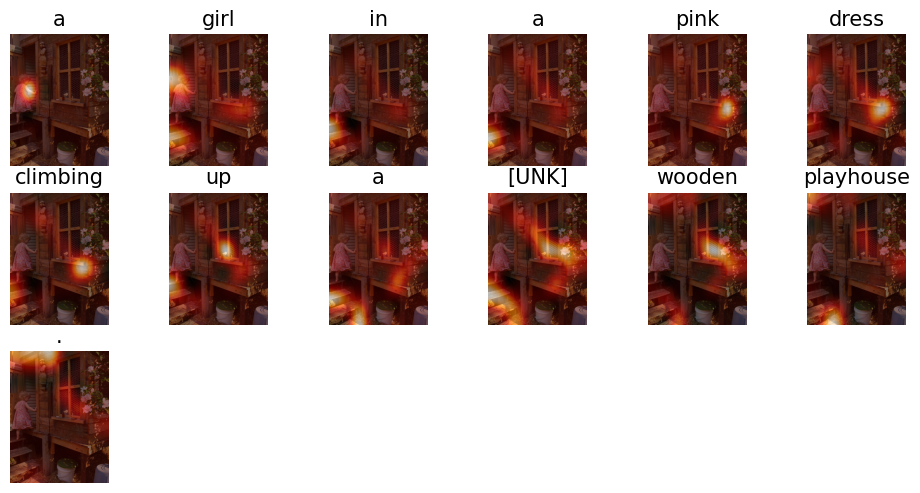




BELU score: 
Individual 1-gram: 34.42622950819672
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/101654506_8eb26cfb60.jpg


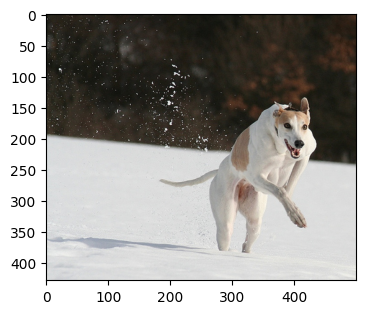

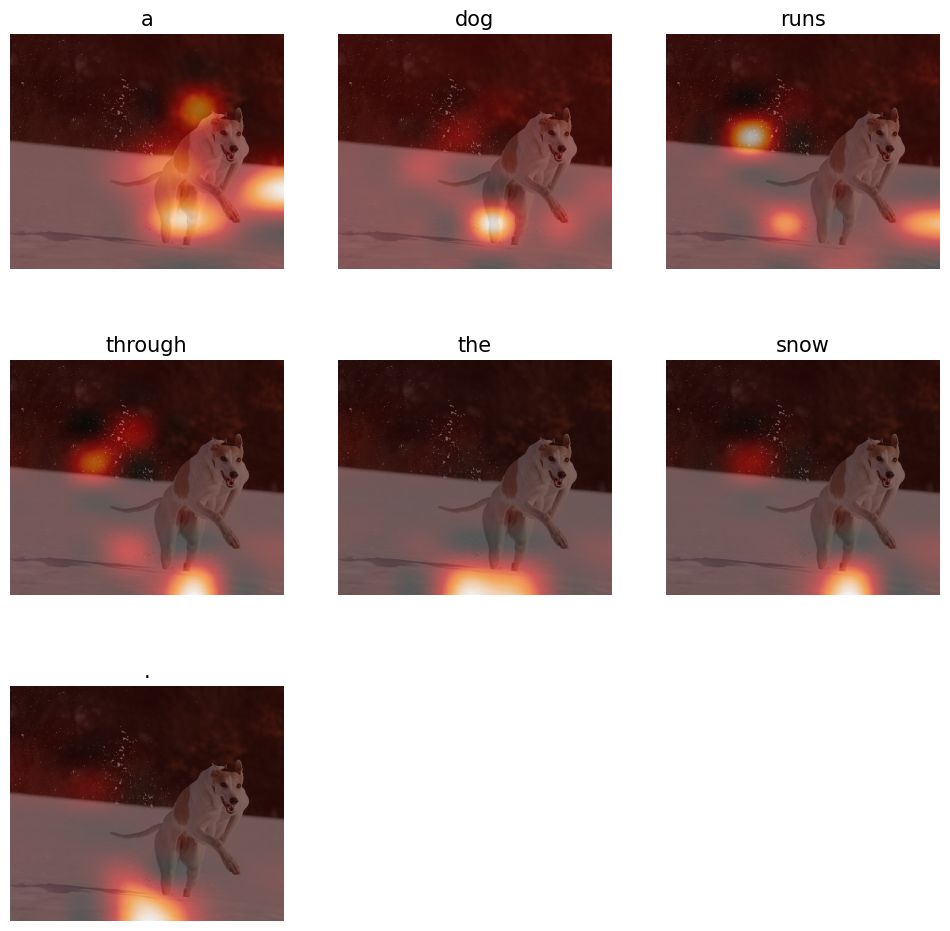




BELU score: 
Individual 1-gram: 48.275862068965516
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/1024138940_f1fefbdce1.jpg


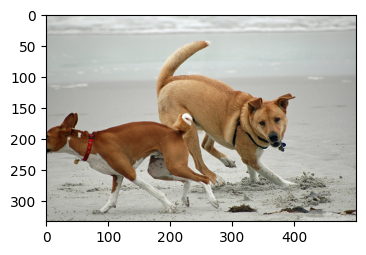

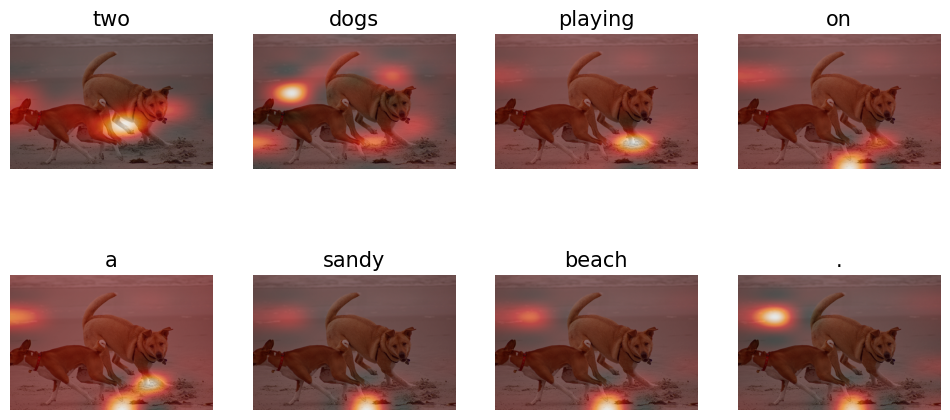




BELU score: 
Individual 1-gram: 51.42857142857142
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/1034276567_49bb87c51c.jpg


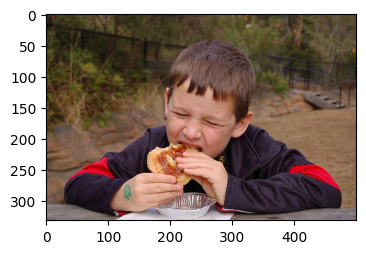

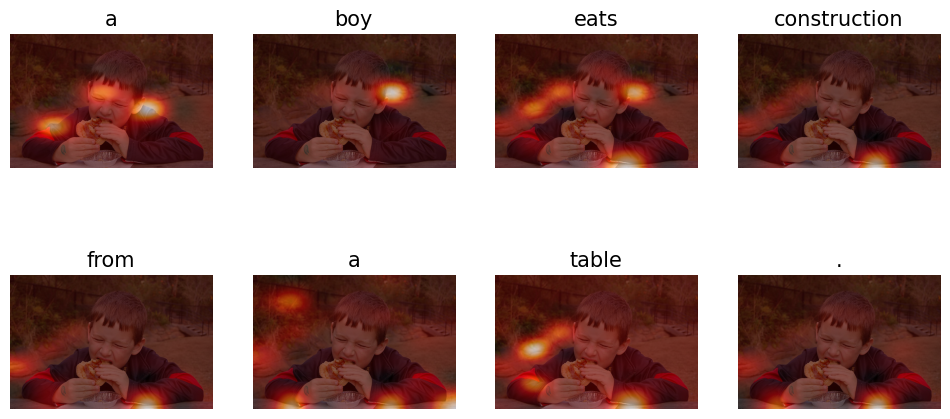




BELU score: 
Individual 1-gram: 36.84210526315789
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/1055753357_4fa3d8d693.jpg


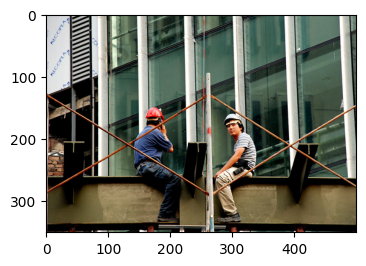

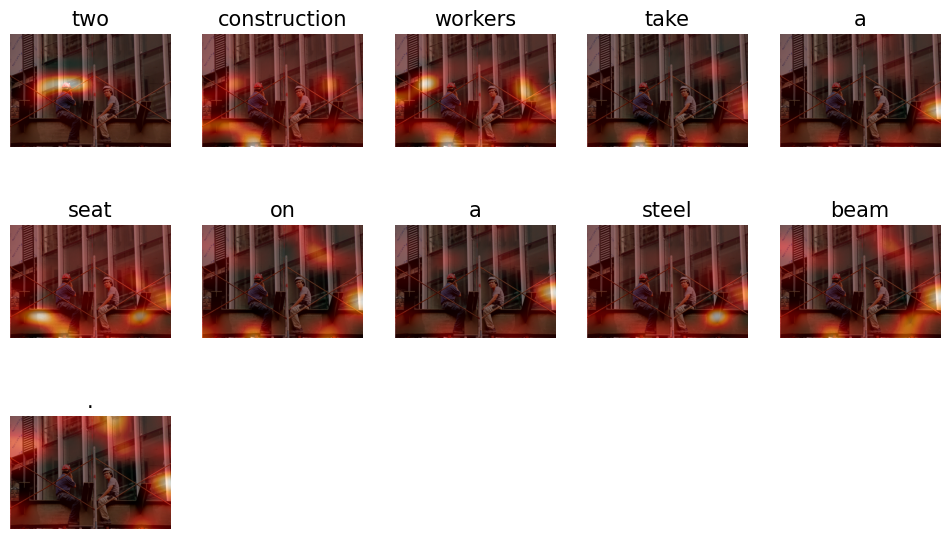




BELU score: 
Individual 1-gram: 29.629629629629626
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/1067180831_a59dc64344.jpg


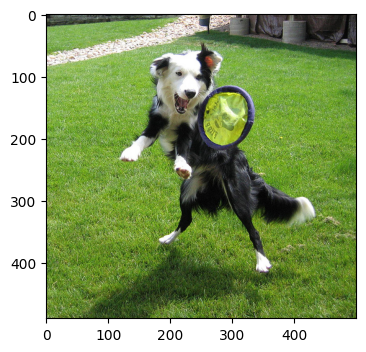

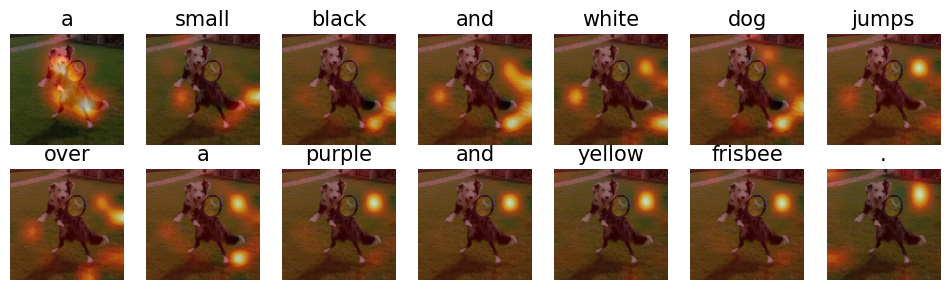




BELU score: 
Individual 1-gram: 33.82352941176471
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/1077931201_1e0bb83105.jpg


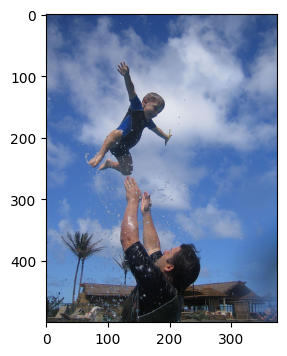

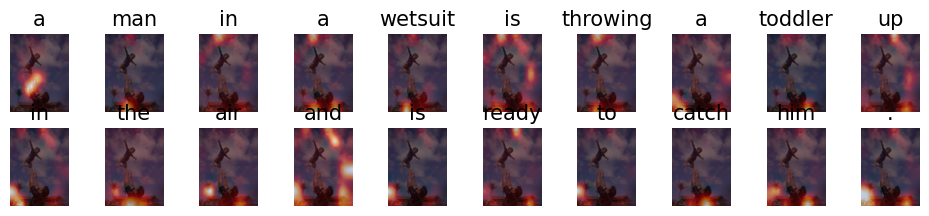




BELU score: 
Individual 1-gram: 20.731707317073166
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/108898978_7713be88fc.jpg


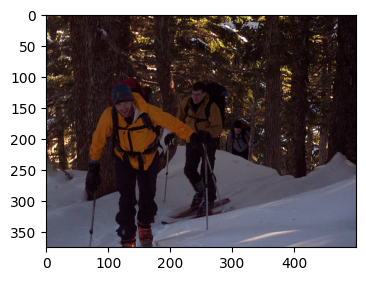

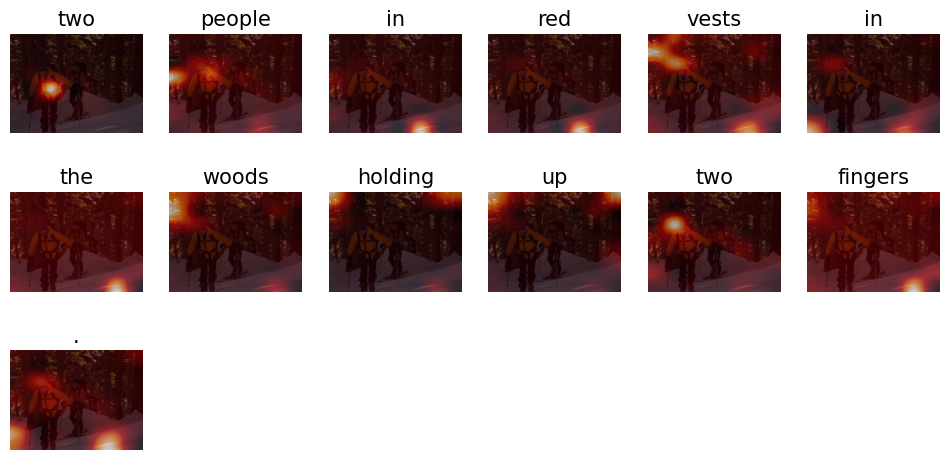




BELU score: 
Individual 1-gram: 26.229508196721312
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/1094462889_f9966dafa6.jpg


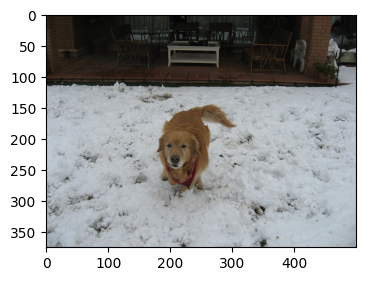

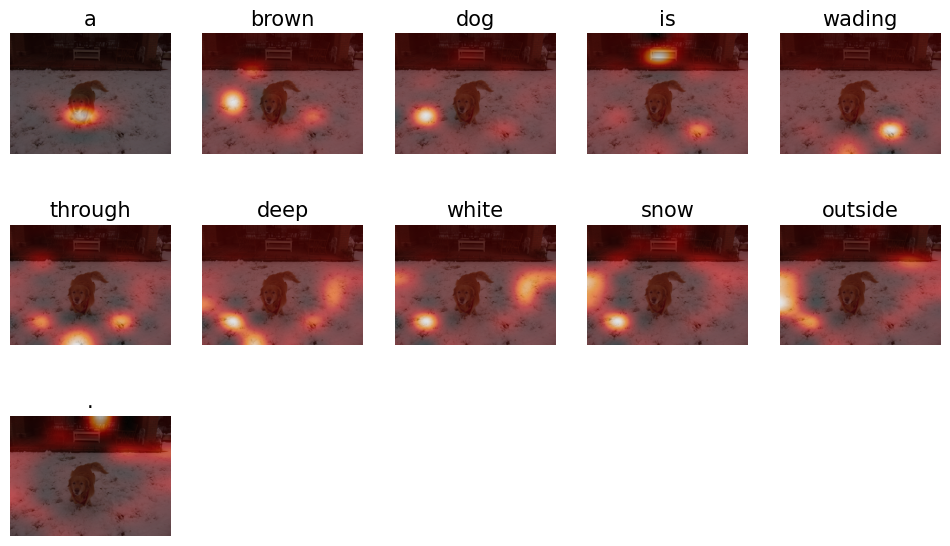




BELU score: 
Individual 1-gram: 25.454545454545453
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/Images/109738916_236dc456ac.jpg


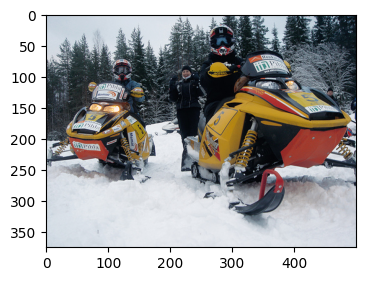

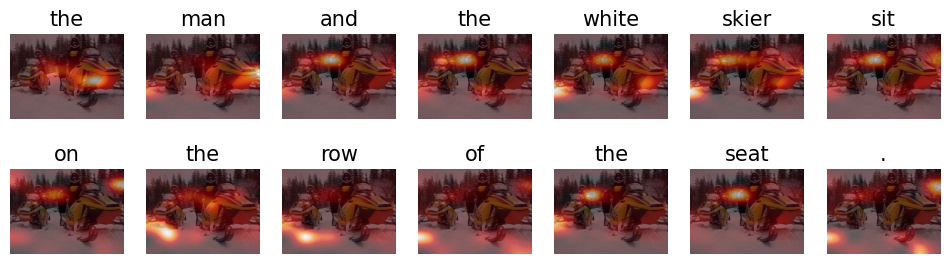




BELU score: 
Individual 1-gram: 21.428571428571423
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306


/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

In [ ]:
# Select the 10 entries from the dataframe columns 'Path' and 'Captions' as a list of [file_name, caption] pairs
validation_data = df[['Path', 'Captions']][:500:50].values.tolist()

generate_caption(validation_data)

#### **BLEU Score Interpretation**

- The BLEU 1-gram scores are moderately high (ranging from about 20.7 to 51.4), indicating decent overlap for individual words between predicted and actual captions.


- BLEU scores for 2-grams, 3-grams, and 4-grams are virtually zero in all examples, showing that the model's generated phrases do not align well with actual multi-word sequences found in the ground truth.


- The consistent warnings suggest zero counts of matching bigrams, trigrams, and four-grams, meaning the model is not reproducing accurate or fluent multi-word expressions that match reference captions.

#### **Evaluation results**

The evaluation results show several positive aspects of the model's performance. The captions generated frequently include key subjects and actions present in the reference captions, as reflected by the moderate BLEU-1 scores in every example. This demonstrates that the model has learned to identify and describe core elements in diverse images, which is a meaningful achievement.


**Model Strengths**
- The model consistently picks up important single-word tokens that match ground truth captions, as seen in 1-gram overlaps for objects (e.g., "dog," "child," "snow") and actions (e.g., "running," "climbing").

- Many predicted captions communicate the overall scene context or primary activity, even when multi-word phrasing differs from the reference.

- The use of attention mechanisms within the architecture has clearly enabled focused and relevant description generation for varied visual inputs.


**Opportunities for Improvement**
- Further increasing the size and diversity of the training dataset could expose the model to more examples of fluent phrasing and detail, helping it learn richer patterns for multi-word and complex descriptions.

- Extending training duration would likely enhance the model’s ability to match longer n-grams, as it would gain more opportunities to refine the synthesis of accurate and natural-sounding multi-word expressions.

- Exploring data augmentation or varied captioning styles could also contribute to greater flexibility in generating extended and contextually accurate text sequences.

**Overall**, the model demonstrates clear wins in capturing image content with accurate keywords and basic sentence structure. With additional data and continued training, stronger results on longer n-gram BLEU scores can be expected, leading to even more fluent and comprehensive caption generation.

### Evaluation using unseen Images

Processing file:  /content/a boy and a gir playing with a ball.jpg


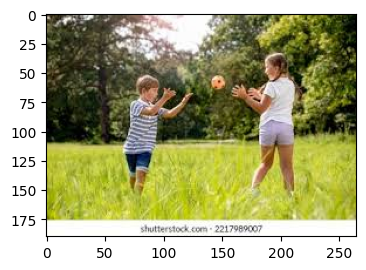

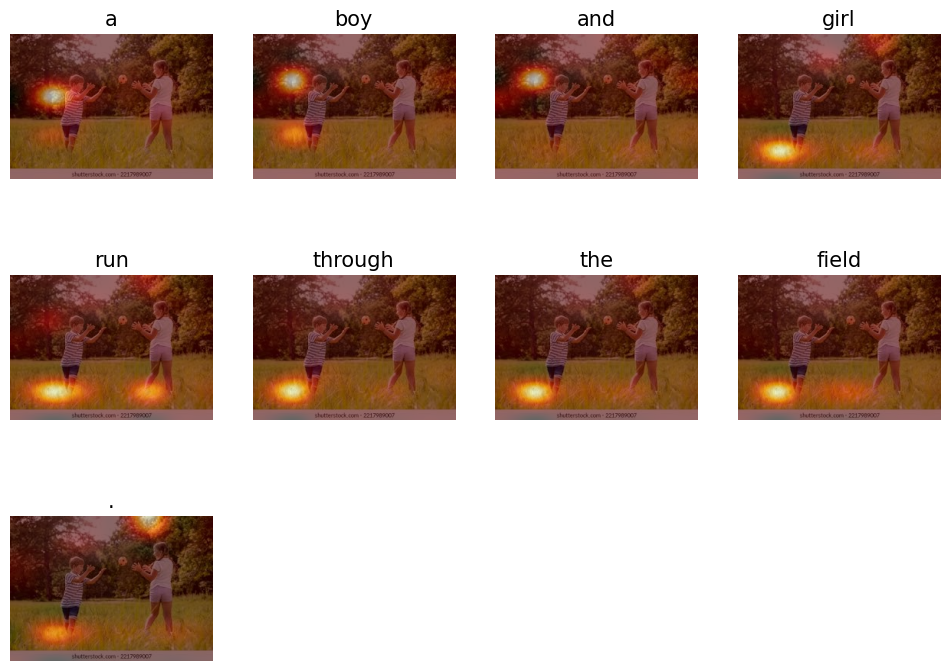




BELU score: 
Individual 1-gram: 36.84210526315789
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/two men playing soccer.png


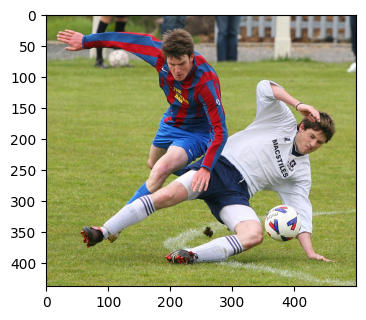

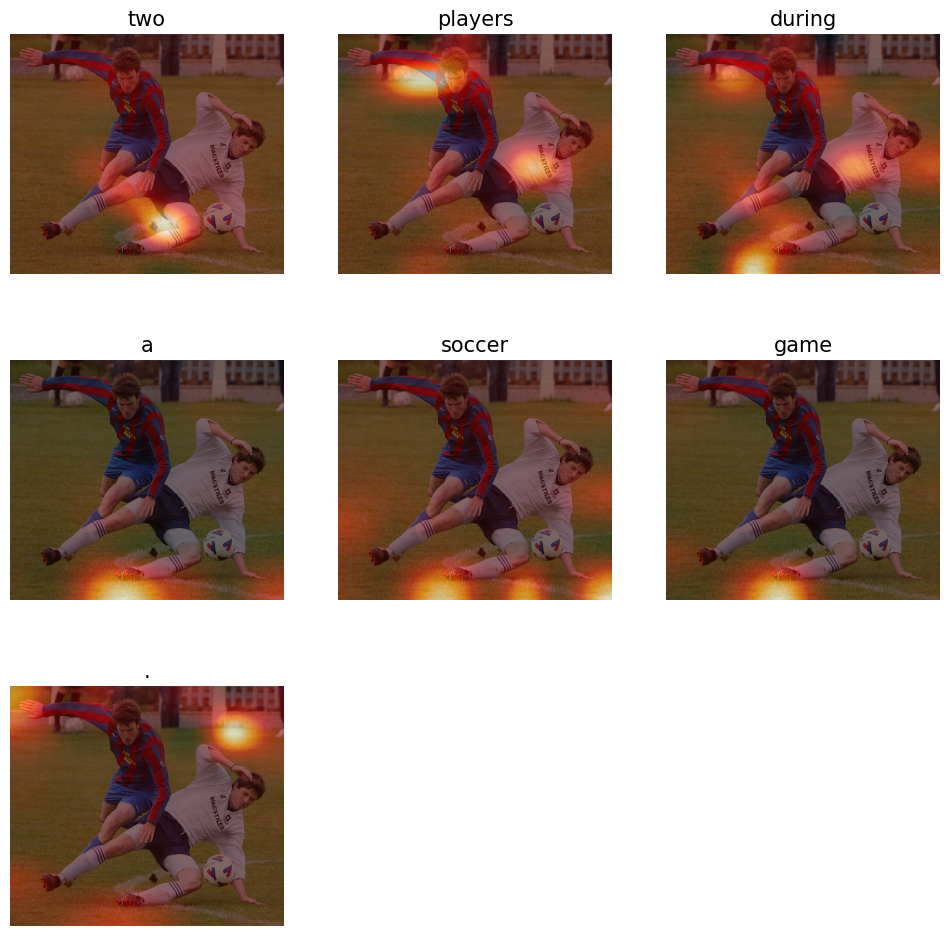




BELU score: 
Individual 1-gram: 47.05882352941176
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306




/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Processing file:  /content/a brown dog sitting on grass.jpg


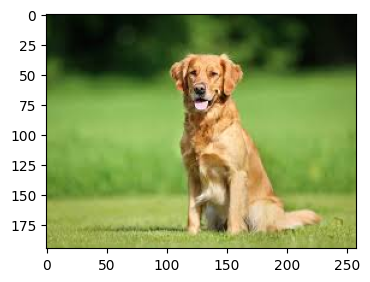

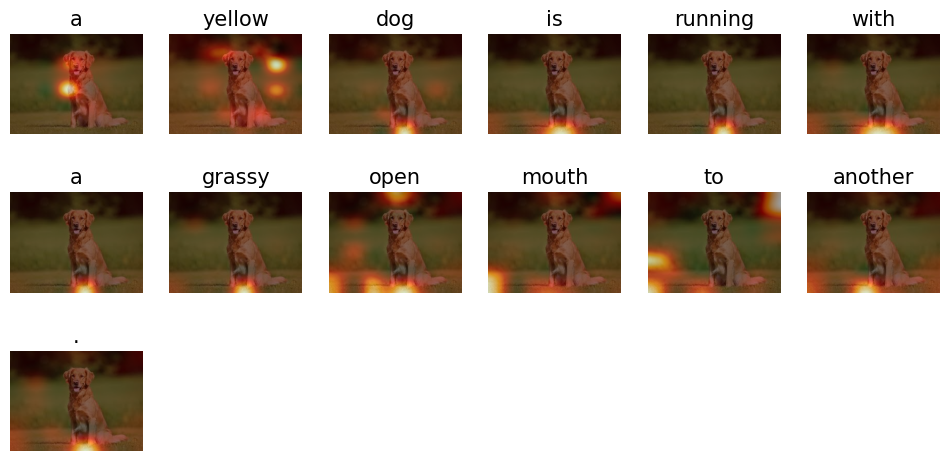




BELU score: 
Individual 1-gram: 21.311475409836063
Individual 2-gram: 2.2250738585072627e-306
Individual 3-gram: 2.2250738585072627e-306
Individual 4-gram: 2.2250738585072627e-306


/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

In [ ]:
unseen_data = [['/content/a boy and a gir playing with a ball.jpg', 'A boy and a girl playing with a ball .'],
               ['/content/two men playing soccer.png', 'Two men playing soccer .'],
               ['/content/a brown dog sitting on grass.jpg', 'A brown dog sitting on grass.jpg'],
               ]
generate_caption(unseen_data)


In [ ]:
import shutil

shutil.make_archive('/content/MP3', 'zip', '/content/MP3')

'/content/MP3.zip'

#### **Evaluation results using unseen Images**

These results for unseen images highlight that the model is able to generalize reasonably well, capturing central subjects and contexts even when faced with new inputs. The model maintains its strength in identifying keywords and scene themes, as reflected in the 1-gram BLEU scores, despite not having previously encountered these images.


**Strengths on Unseen Images**
- The model’s captions consistently feature the main entities (such as "boy," "girl," "soccer," "dog") and generally provide a good description of the image content.

- Predicted sentences like "two players during a soccer game" for an image of "two men playing soccer" show flexibility in expression while retaining semantic relevance.

- The ability to deliver coherent, context-aware descriptions of novel scenes is a positive indicator of effective feature extraction and attention-guided caption generation.


**Overall**, the model demonstrates clear wins in its ability to generalize core content for unseen images, making accurate keyword-based predictions. Increased training and a broader dataset would foster even greater gains in multi-word fluency and detail alignment, enabling stronger results for longer n-gram metrics on new, unfamiliar images.

## **Conclusion**
In conclusion, the model effectively captures important objects and actions within images, generating captions that convey the core meaning in both seen and unseen examples. Although longer, more complex phrase generation is currently limited, the underlying architecture demonstrates solid potential. With further training and access to larger, more varied datasets, the model’s performance on multi-word phrase accuracy can improve substantially, resulting in more fluent and detailed captions. This foundation positions the model well for future enhancements in image captioning quality.